In [1]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
import os
%matplotlib inline

In [2]:
from xmitgcm import open_mdsdataset

In [3]:
import xgcm
xgcm

<module 'xgcm' from '/rigel/home/ra2697/xgcm/xgcm/__init__.py'>

In [4]:
from dask.distributed import Client
client = Client(scheduler_file='/rigel/home/ra2697/scheduler.json')

In [5]:
client#.restart()

Client Scheduler: tcp://10.43.4.93:8786 Dashboard: http://10.43.4.93:8787,Cluster Workers: 23 Cores: 92 Memory: 422.06 GB


In [6]:
ddir = '/rigel/ocp/users/jb3210/projects/aviso_surface_tracer/runs'
run = 'run_KOC_PSI_variance_budget'
rundir = os.path.join(ddir,run)
timestep = 900 # in seconds
kappa = 63

In [276]:
ds = open_mdsdataset(rundir, prefix=['tracer_diags', 'vel_diags'],
                     delta_t=900, ref_date='1993-01-01')
ds

/rigel/home/ra2697/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/rigel/home/ra2697/xmitgcm/xmitgcm/mds_store.py:220: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:   (XC: 3600, XG: 3600, YC: 1600, YG: 1600, Z: 1, Zl: 1, Zp1: 2, Zu: 1, time: 221)
Coordinates:
  * XC        (XC) float32 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
  * YC        (YC) float32 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XG        (XG) float32 -2.77556e-17 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 ...
  * YG        (YG) float32 -80.0 -79.9 -79.8 -79.7 -79.6 -79.5 -79.4 -79.3 ...
  * Z         (Z) float32 -50.0
  * Zp1       (Zp1) float32 0.0 -100.0
  * Zu        (Zu) float32 -100.0
  * Zl        (Zl) float32 0.0
    rA        (YC, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dxG       (YG, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dyG       (YC, XG) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth     (YC, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    rAz       (YG, XG) float32 dask.array<shape=(1600, 3600), chunksize=(160

In [8]:
vars_to_drop = [vname for vname in ds.variables if '02' in vname]
ds = ds.drop(vars_to_drop)
ds

<xarray.Dataset>
Dimensions:   (XC: 3600, XG: 3600, YC: 1600, YG: 1600, Z: 1, Zl: 1, Zp1: 2, Zu: 1, time: 221)
Coordinates:
  * XC        (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
  * YC        (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XG        (XG) >f4 -2.77556e-17 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0 ...
  * YG        (YG) >f4 -80.0 -79.9 -79.8 -79.7 -79.6 -79.5 -79.4 -79.3 -79.2 ...
  * Z         (Z) float32 -50.0
  * Zp1       (Zp1) float32 0.0 -100.0
  * Zu        (Zu) float32 -100.0
  * Zl        (Zl) float32 0.0
    rA        (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dxG       (YG, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dyG       (YC, XG) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth     (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    rAz       (YG, XG) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dxC       (Y

In [9]:
ds.nbytes/1e9

81.74596518

In [10]:
dsp = ds.persist()

In [277]:
ds_snap = open_mdsdataset(rundir, prefix=['tracer_snapshots'],
                          delta_t=900, ref_date='1993-01-01').persist()
ds_snap

/rigel/home/ra2697/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/rigel/home/ra2697/xmitgcm/xmitgcm/mds_store.py:220: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:   (XC: 3600, XG: 3600, YC: 1600, YG: 1600, Z: 1, Zl: 1, Zp1: 2, Zu: 1, time: 222)
Coordinates:
  * XC        (XC) float32 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
  * YC        (YC) float32 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XG        (XG) float32 -2.77556e-17 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 ...
  * YG        (YG) float32 -80.0 -79.9 -79.8 -79.7 -79.6 -79.5 -79.4 -79.3 ...
  * Z         (Z) float32 -50.0
  * Zp1       (Zp1) float32 0.0 -100.0
  * Zu        (Zu) float32 -100.0
  * Zl        (Zl) float32 0.0
    rA        (YC, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dxG       (YG, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    dyG       (YC, XG) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth     (YC, XC) float32 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    rAz       (YG, XG) float32 dask.array<shape=(1600, 3600), chunksize=(160

In [12]:
tr01sq_mean = ds_snap.TRACSQ01.mean(dim=['YC', 'XC']).load()

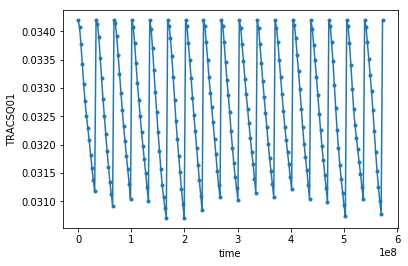

In [13]:
tr01sq_mean.plot(marker='.')

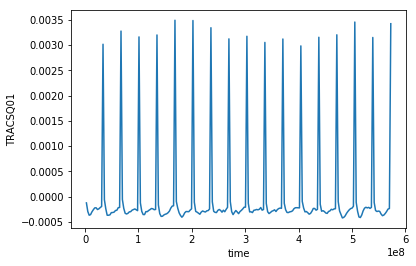

In [14]:
tr01sq_mean_diff = tr01sq_mean.diff(dim='time')
tr01sq_mean_diff.plot()

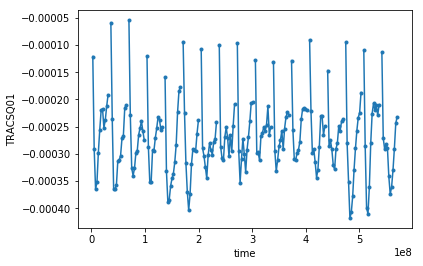

In [16]:
reset_mask = tr01sq_mean_diff < 0
tr01sq_mean_diff.where(reset_mask).plot(marker='.')

In [141]:
grid = xgcm.Grid(dsp)
grid

<xgcm.Grid>
Z Axis (periodic):
  * center   Z (1) --> left
  * left     Zl (1) --> center
  * face     Zp1 (2) --> center
  * right    Zu (1) --> center
T Axis (periodic):
  * center   time (221)
X Axis (periodic):
  * center   XC (3600) --> left
  * left     XG (3600) --> center
Y Axis (periodic):
  * center   YC (1600) --> left
  * left     YG (1600) --> center

## Tracer Budget

$$ \frac{\partial q}{\partial t} = - \nabla \cdot (\mathbf{u} q) + q (\nabla \cdot \mathbf{u}) + \nabla \cdot \kappa \nabla q $$

The first two terms on the RHS represent advection.
We would like for the divergence term to be zero, but unfortunately this is not the case. It is key for closing the budget locally.

In [142]:
uflux = dsp.UTRAC01 * dsp.dyG
vflux = dsp.VTRAC01 * dsp.dxG
div_adv_flux = (grid.diff(uflux, 'X') + grid.diff(vflux, 'Y')) / dsp.rA
div_adv_flux

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [143]:
dsp.drF.load()

<xarray.DataArray 'drF' (Z: 1)>
array([ 100.], dtype=float32)
Coordinates:
  * Z        (Z) float32 -50.0
    drF      (Z) float32 100.0
    PHrefC   (Z) float32 490.5
Attributes:
    standard_name:  cell_z_size
    long_name:      cell z size
    units:          m

In [144]:
# just use constant dfF
drF = 100.
uflux_gad = dsp.ADVxTr01 / drF
vflux_gad = dsp.ADVyTr01 / drF
div_adv_flux_gad = (grid.diff(uflux_gad, 'X') + grid.diff(vflux_gad, 'Y')) / dsp.rA
div_adv_flux_gad

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [145]:
uvelflux = dsp.UVEL * dsp.dyG * ds.hFacW
vvelflux = dsp.VVEL * dsp.dxG * ds.hFacS
div_vel_flux = (grid.diff(uvelflux, 'X') + grid.diff(vvelflux, 'Y')) / dsp.rA
trac_div_vel = dsp.TRAC01 * div_vel_flux
trac_div_vel

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [146]:
uflux_diff = -kappa * grid.diff(dsp.TRAC01, 'X') / dsp.dxC * dsp.dyG * dsp.hFacW
vflux_diff = -kappa * grid.diff(dsp.TRAC01, 'Y') / dsp.dyC * dsp.dxG * dsp.hFacS
div_diff_flux = (grid.diff(uflux_diff, 'X') + grid.diff(vflux_diff, 'Y')) / dsp.rA
div_diff_flux

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [147]:
uflux_diff_gad = dsp.DFxETr01 / drF
vflux_diff_gad = dsp.DFyETr01 / drF
div_diff_flux_gad = (grid.diff(uflux_diff_gad, 'X') + grid.diff(vflux_diff_gad, 'Y')) / dsp.rA
div_diff_flux_gad

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [148]:
delta_t = dsp.time[0].values
dqdt = ds_snap.TRAC01.diff(dim='time') / delta_t
dqdt

<xarray.DataArray 'TRAC01' (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float64, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [149]:
# slam everything into a dataset
ds_budget = xr.Dataset({'tendency': dqdt,
                        'advection': div_adv_flux, 'advection_gad': div_adv_flux_gad,
                        'diffusion': div_diff_flux, 'diffusion_gad': div_diff_flux_gad,
                        'divergence': -trac_div_vel})
ds_budget

<xarray.Dataset>
Dimensions:        (XC: 3600, YC: 1600, time: 221)
Coordinates:
  * XC             (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 ...
  * YC             (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA             (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth          (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC          (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter           (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time           (time) int64 2592000 5184000 7776000 10368000 12960000 ...
Data variables:
    tendency       (time, YC, XC) float64 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    advection      (time, YC, XC) float32 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    advection_gad  (time, YC, XC) float32 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    diffusion     

In [150]:
ds_budget['residual'] = (ds_budget.tendency + ds_budget.advection
                         + ds_budget.diffusion + ds_budget.divergence)
ds_budget['residual_gad'] = (ds_budget.tendency + ds_budget.advection_gad
                             + ds_budget.diffusion_gad + ds_budget.divergence)

In [27]:
# first look at first timestep
budget_first = ds_budget.isel(time=1).load()

In [88]:
regions = {'agulhas': {'XC': slice(0,50), 'YC': slice(-70, -30)},
           'eq_pacific': {'XC': slice(180, 230), 'YC': slice(-10, 30)},
           'gulf_stream': {'XC': slice(280, 320), 'YC': slice(20, 50)}} 
vmax = 2e-8

In [25]:
plt.rcParams['figure.figsize'] = (9,6)

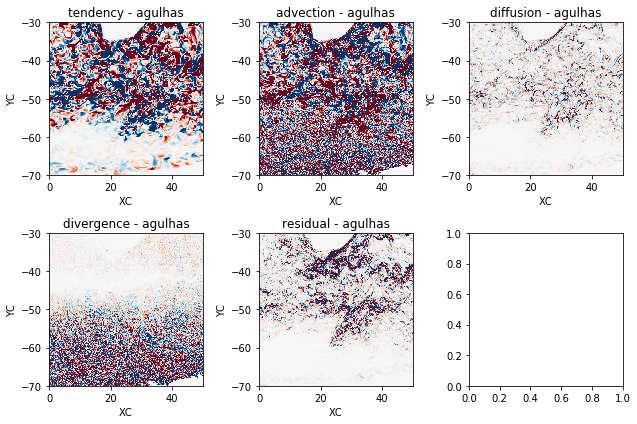

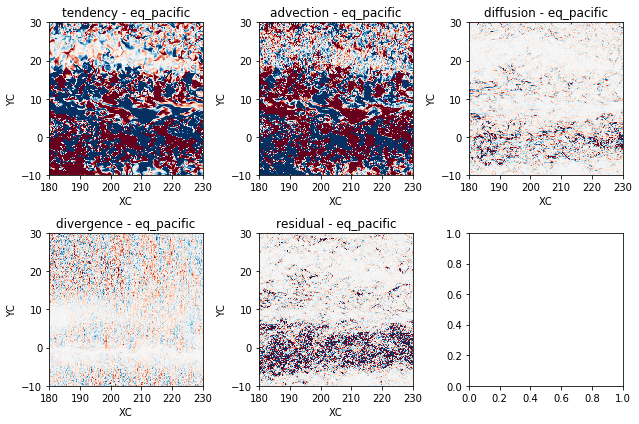

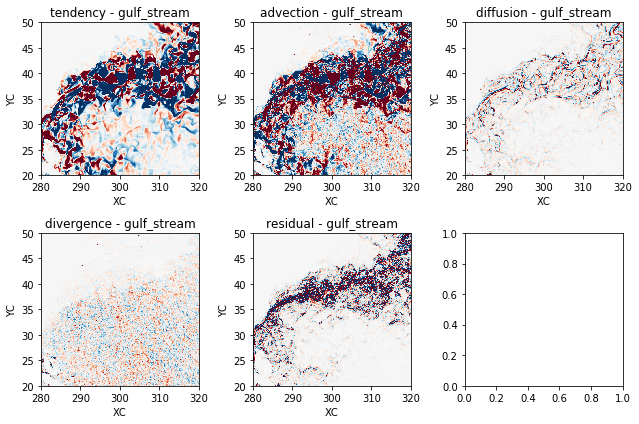

In [42]:
terms = ['tendency', 'advection', 'diffusion', 'divergence', 'residual']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=3, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_first[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

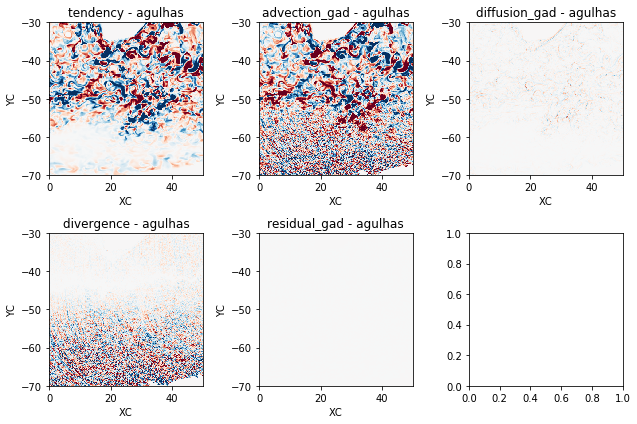

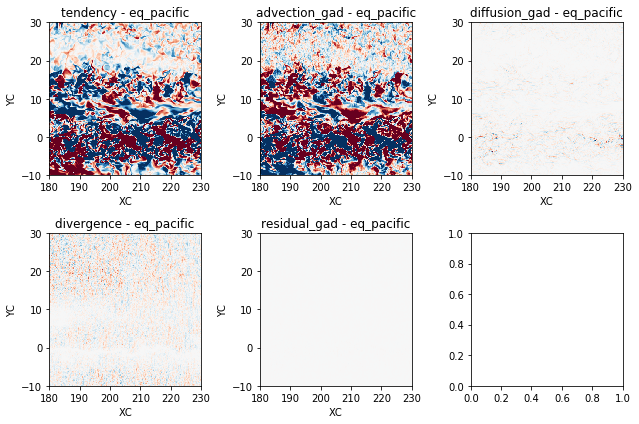

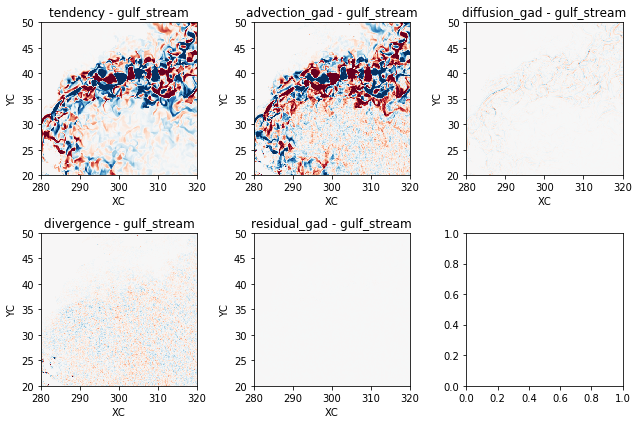

In [31]:
terms = ['tendency', 'advection_gad', 'diffusion_gad', 'divergence', 'residual_gad']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=3, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_first[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

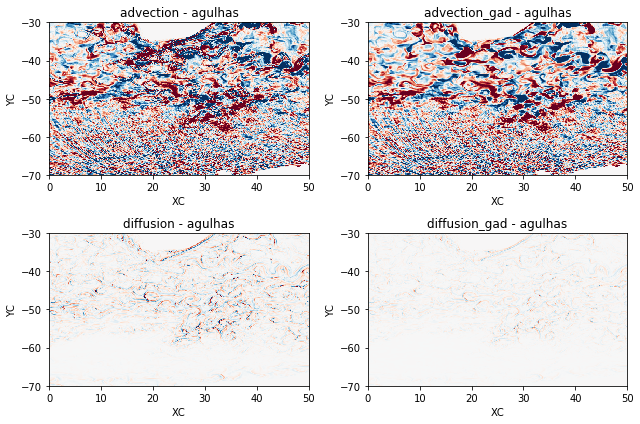

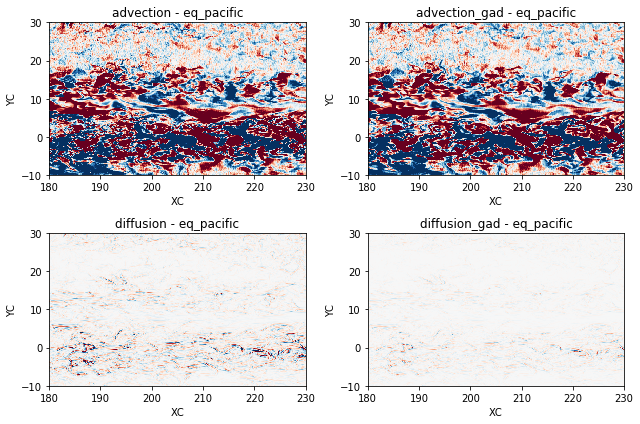

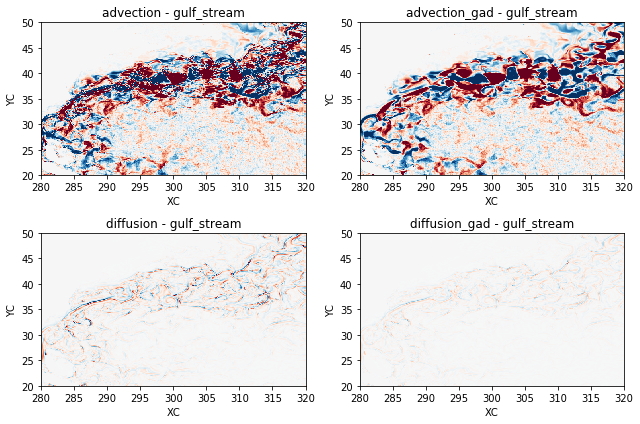

In [32]:
terms = ['advection', 'advection_gad', 'diffusion', 'diffusion_gad']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=2, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_first[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

In [34]:
((budget_first**2)**0.5).mean()

<xarray.Dataset>
Dimensions:        ()
Data variables:
    tendency       float64 5.248e-09
    advection      float64 6.098e-09
    advection_gad  float64 5.801e-09
    diffusion      float64 8.019e-10
    diffusion_gad  float64 3.186e-10
    divergence     float64 1.184e-09
    residual       float64 1.435e-09
    residual_gad   float64 7.228e-12

In [35]:
# now do the whole timeseries
budget_mean = ds_budget.where(reset_mask).mean(dim='time').load()

In [36]:
((budget_mean**2)**0.5).mean()

<xarray.Dataset>
Dimensions:        ()
Data variables:
    tendency       float64 6.622e-10
    advection      float64 1.534e-09
    advection_gad  float64 1.504e-09
    diffusion      float64 9.717e-11
    diffusion_gad  float64 3.861e-11
    divergence     float64 1.144e-09
    residual       float64 1.665e-10
    residual_gad   float64 1.468e-12

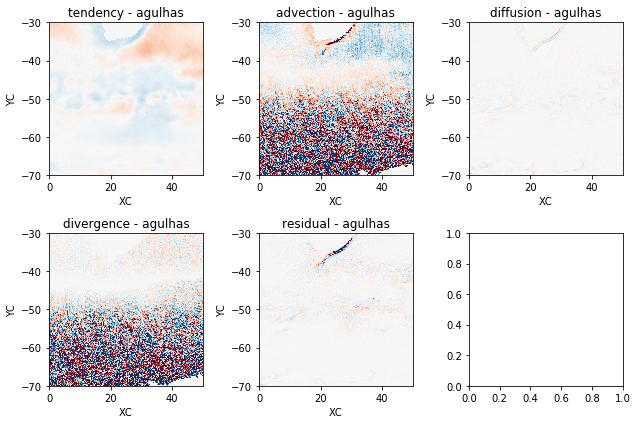

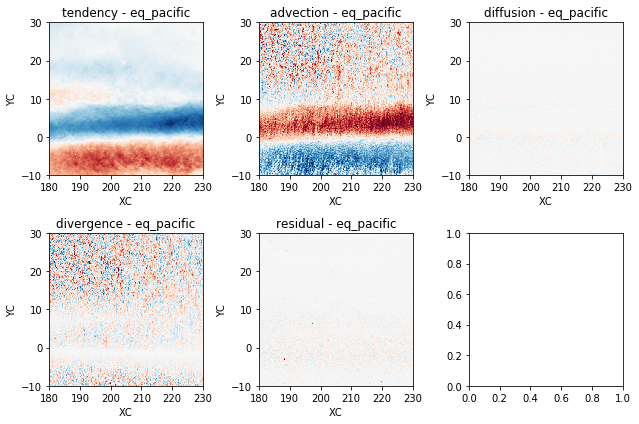

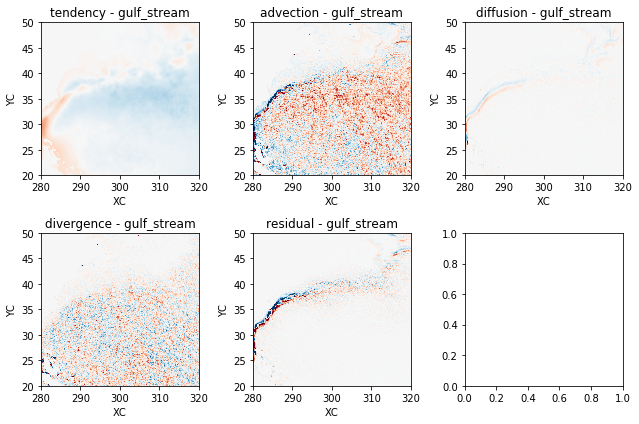

In [37]:
vmax = 1e-8
terms = ['tendency', 'advection', 'diffusion', 'divergence', 'residual']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=3, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_mean[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

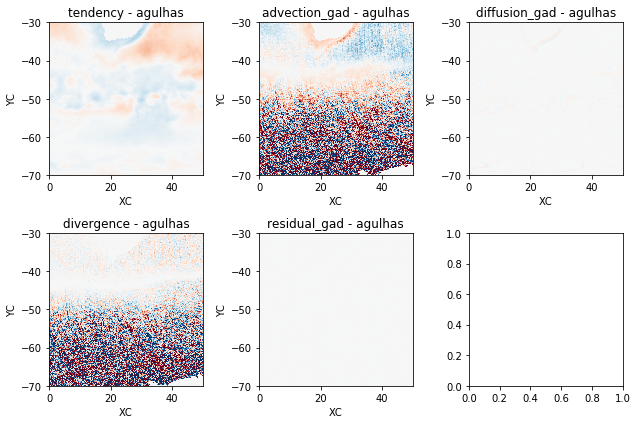

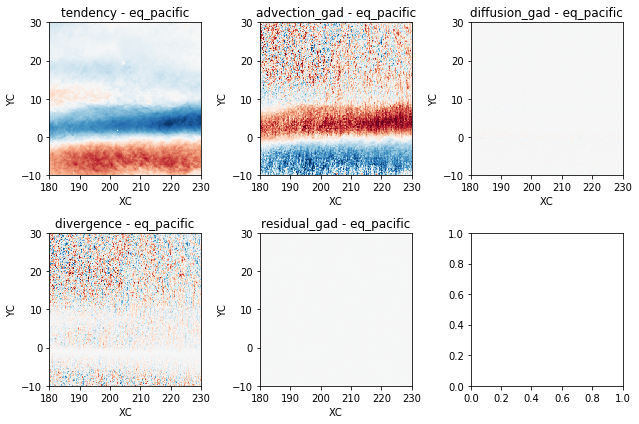

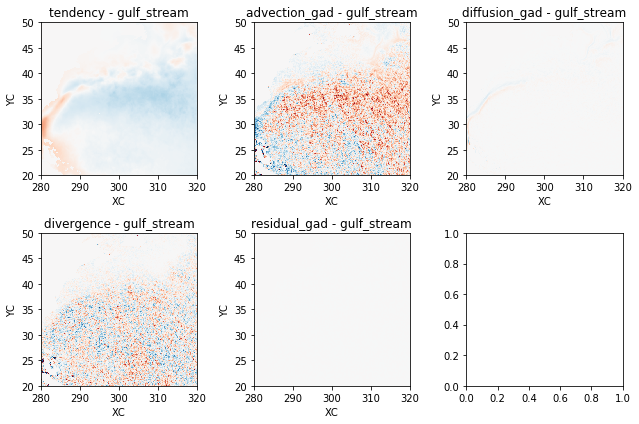

In [38]:
vmax = 1e-8
terms = ['tendency', 'advection_gad', 'diffusion_gad', 'divergence', 'residual_gad']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=3, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_mean[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

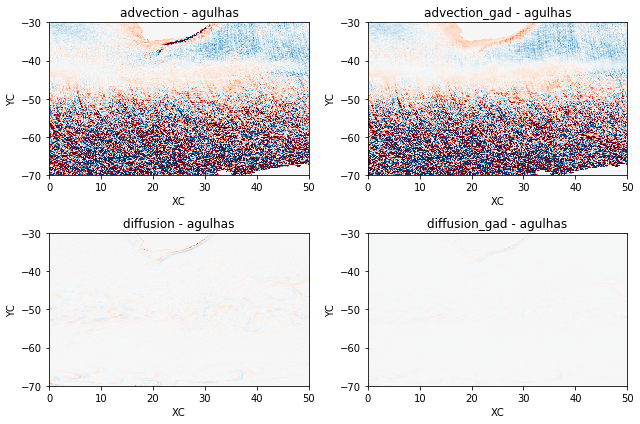

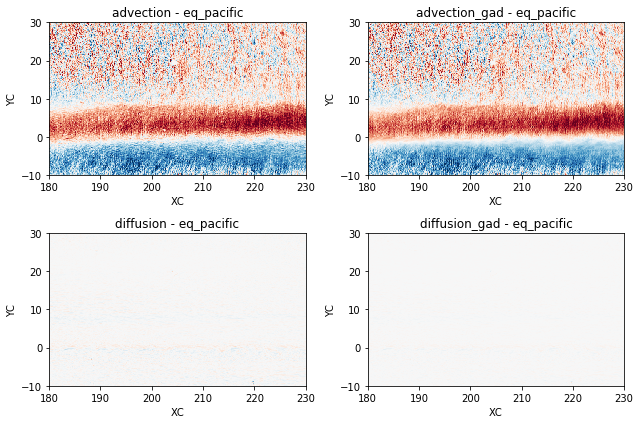

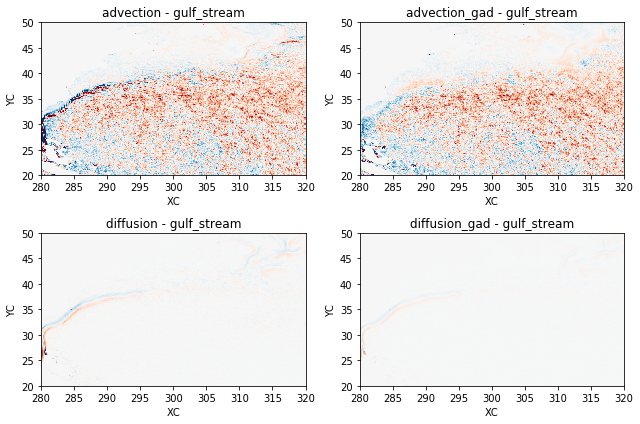

In [39]:
terms = ['advection', 'advection_gad', 'diffusion', 'diffusion_gad']
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=2, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        budget_mean[term].sel(**region).plot(ax=ax, vmax=vmax, add_colorbar=False)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

## Variance Budget

We write it like

$$ \frac{\partial}{\partial t} \frac{q^2}{2} + \nabla \cdot \left ( \frac{ \mathbf{u} q^2}{2}  \right )
 - \frac{q^2}{2} \nabla \cdot \mathbf{u} - \nabla \cdot \kappa \nabla \frac{q^2}{2} + \kappa | \nabla q |^2 = 0 $$

In [43]:
q2_uflux = dsp.UTrSq01 * dsp.dyG
q2_vflux = dsp.VTrSq01 * dsp.dxG
div_q2_adv_flux = (grid.diff(q2_uflux, 'X') + grid.diff(q2_vflux, 'Y')) / dsp.rA
div_q2_adv_flux

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [44]:
# this is only approximate because we didn't save the eddy correlation
# of q with divergence
q2_div_vel = dsp.TRACSQ01 * div_vel_flux
q2_div_vel

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [45]:
q2_udiff = -kappa * grid.diff(dsp.TRACSQ01, 'X') / dsp.dxC * dsp.dyG * dsp.hFacW
q2_vdiff = -kappa * grid.diff(dsp.TRACSQ01, 'Y') / dsp.dyC * dsp.dxG * dsp.hFacS
q2_div_diff_flux = (grid.diff(q2_udiff , 'X') + grid.diff(q2_vdiff, 'Y')) / dsp.rA
q2_div_diff_flux

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [46]:
q2_dissipation = kappa * (grid.interp(dsp.DXSqTr01 * dsp.hFacW, 'X') +
                          grid.interp(dsp.DYSqTr01 * dsp.hFacS, 'Y'))
q2_dissipation

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...

In [47]:
dq2dt = ds_snap.TRACSQ01.diff(dim='time') / delta_t
dq2dt

<xarray.DataArray 'TRACSQ01' (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float64, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 2880 5760 8640 11520 14400 17280 20160 23040 25920 ...
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [48]:
q2_budget = xr.Dataset({'tendency': dq2dt/2,
                        'advection': div_q2_adv_flux/2, 
                        'diffusion': q2_div_diff_flux/2,
                        'dissipation': q2_dissipation,
                        'divergence': -q2_div_vel/2})
q2_budget['residual'] = (q2_budget.tendency + q2_budget.advection +
                         q2_budget.diffusion + q2_budget.dissipation +
                         q2_budget.divergence)
q2_budget

<xarray.Dataset>
Dimensions:      (XC: 3600, YC: 1600, time: 221)
Coordinates:
  * XC           (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
  * YC           (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA           (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth        (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC        (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter         (time) int64 2880 5760 8640 11520 14400 17280 20160 23040 ...
  * time         (time) int64 2592000 5184000 7776000 10368000 12960000 ...
Data variables:
    tendency     (time, YC, XC) float64 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    advection    (time, YC, XC) float32 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    diffusion    (time, YC, XC) float32 dask.array<shape=(221, 1600, 3600), chunksize=(1, 1600, 3600)>
    dissipation  (time, YC,

In [50]:
q2_budget_mean = q2_budget.where(reset_mask).mean(dim='time').load()

In [51]:
((q2_budget_mean * dsp.rA).sum() / dsp.rA.sum()).load()

<xarray.Dataset>
Dimensions:      ()
Data variables:
    tendency     float64 -6.822e-11
    advection    float32 5.74167e-19
    diffusion    float32 1.31197e-20
    dissipation  float32 6.46704e-11
    divergence   float32 -2.14063e-12
    residual     float64 -5.689e-12

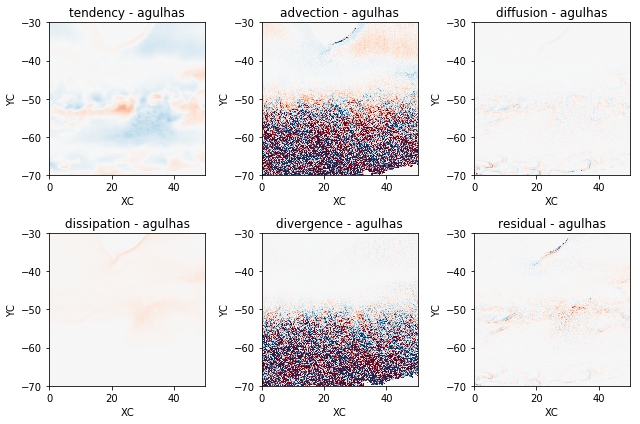

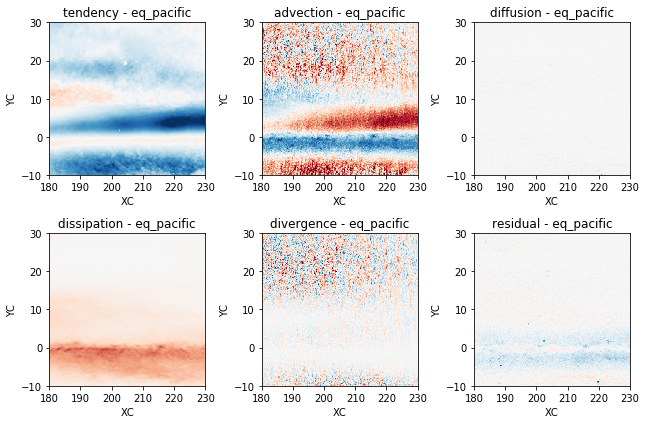

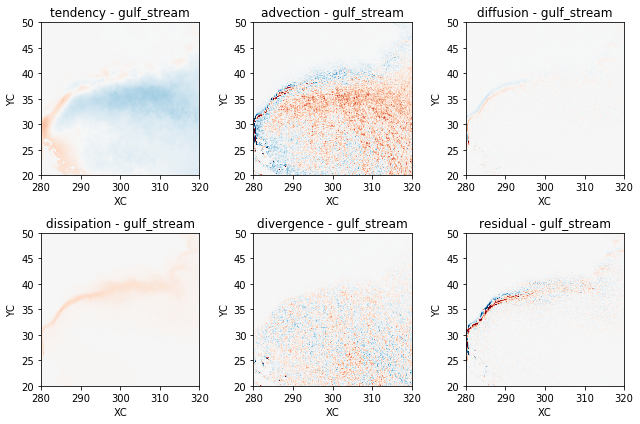

In [52]:
terms = ['tendency', 'advection', 'diffusion', 'dissipation', 'divergence', 'residual']
vmax = 2e-9
plot_kwargs = dict(vmax=vmax, vmin=-vmax, cmap='RdBu_r', add_colorbar=False)
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=3, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        q2_budget_mean[term].sel(**region).plot(ax=ax, **plot_kwargs)
        ax.set_title(term + ' - ' + region_name)
    fig.tight_layout()

## Eddy Variance Budget

$$ \frac{\partial}{\partial t} \frac{\overline{{q'}^2}}{2}
+ \nabla \cdot \left ( \frac{ \overline{ \mathbf{u} {q'}^2 }}{2}  \right )
 - \overline{\frac{{q'}^2}{2} \nabla \cdot \mathbf{u}}
 + \overline{\mathbf{u}'q'} \cdot \nabla \overline{q} 
 - \nabla \cdot \kappa \nabla \frac{\overline{{q'}^2}}{2}
 + \kappa \overline{ | \nabla q' |^2 } = 0 $$
 
 The overbar is defined as a mean over a number of months and a spatial smoothing by convolution.
 Th time mean is done online. The smoothing we do here.
 Because convolution comutes with time average, it doesn't matter the order we do these operations.

In [229]:
# definie smoothing operator
from astropy.convolution import (convolve, convolve_fft,
                                 Gaussian2DKernel, MexicanHat2DKernel)
# 10 grid points =  1 degree
kernel = Gaussian2DKernel(20)
#kernel = MexicanHat2DKernel(11)
def smooth_raw(data):
    # works on xarray data
    raw_data = getattr(data, 'values', data)
    result = convolve_fft(raw_data, kernel, boundary='wrap')
    result[np.isnan(raw_data)] = np.nan
    return result

mask_vars = {('YC', 'XC'): 'hFacC',
             ('YC', 'XG'): 'hFacW',
             ('YG', 'XC'): 'hFacS'}

def spatial_smoother(data):
    xdim = 'XC' if 'XC' in data.dims else 'XG'
    ydim = 'YC' if 'YC' in data.dims else 'YG'
    dims = (ydim, xdim)
    data_masked = data.where(dsp[mask_vars[dims]])
    return xr.apply_ufunc(smooth_raw, data_masked,
                          vectorize=True,
                          dask='parallelized',
                          input_core_dims = [dims],
                          output_core_dims = [dims],
                          output_dtypes=[data.dtype])

In [230]:
qbar = dsp.TRAC01
qbar_smooth = spatial_smoother(qbar)
qbar_smooth

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [231]:
# just time
qp2_time = dsp.TRACSQ01 - qbar**2
# time and space
qp2_timespace = (spatial_smoother(dsp.TRACSQ01) -
                 qbar_smooth**2)
qp2_timespace

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(221,), chunksize=(1,)>
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...

In [232]:
n = 5
qp2_time_sample = qp2_time[n].load()
qp2_timespace_sample = qp2_timespace[n].load()

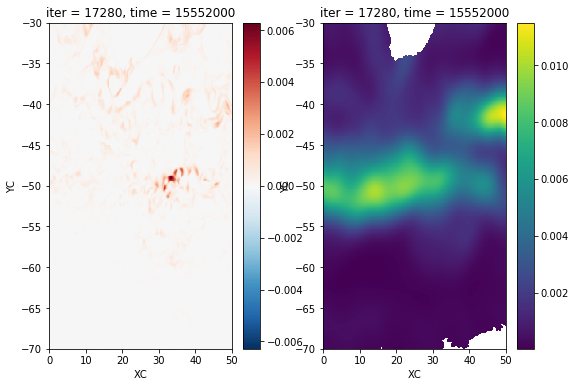

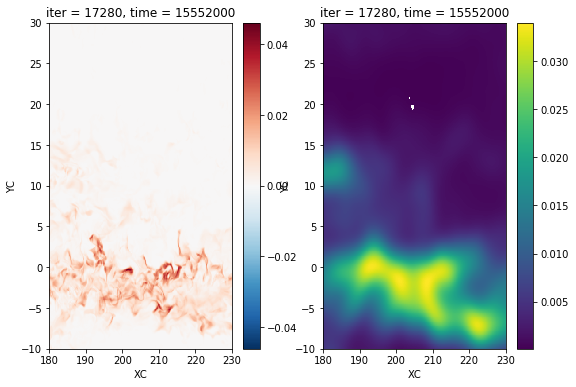

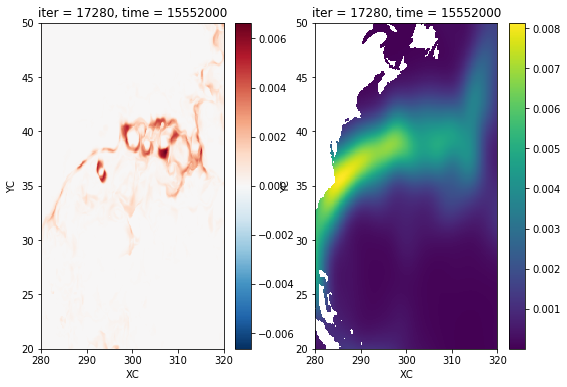

In [233]:
for name, region in regions.items():
    fig, axes = plt.subplots(ncols=2)
    qp2_time_sample.sel(**region).plot(ax=axes[0])
    qp2_timespace_sample.sel(**region).plot(ax=axes[1])

In [137]:
# ok, we will use the timespace operator
qp2 = qp2_timespace

In [154]:
qp2_snap = (spatial_smoother(ds_snap.TRACSQ01)
            - qbar_smooth**2)
dqp2dt = qp2_snap.diff(dim='time') / delta_t
dqp2dt

<xarray.DataArray (time: 220, YC: 1600, XC: 3600)>
dask.array<shape=(220, 1600, 3600), dtype=float64, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 5184000 7776000 10368000 12960000 15552000 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    iter     (time) int64 dask.array<shape=(220,), chunksize=(1,)>

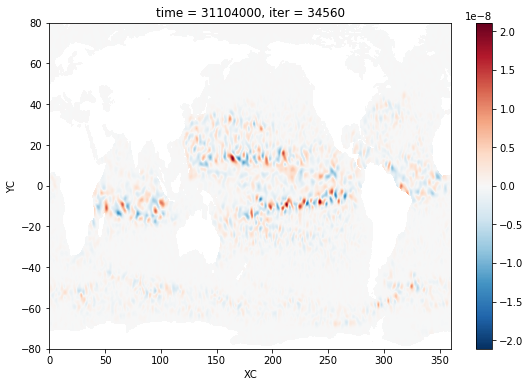

In [159]:
dqp2dt[10].plot()

In [234]:
# use gad fluxes for higher accuracy
uq_gad = spatial_smoother(dsp.ADVxTr01 / (drF * dsp.dyG))
vq_gad = spatial_smoother(dsp.ADVyTr01 / (drF * dsp.dxG))
ubar = spatial_smoother(dsp.UVEL)
vbar = spatial_smoother(dsp.VVEL)
ubarqbar = ubar * grid.interp(qbar_smooth, 'X')
vbarqbar = vbar * grid.interp(qbar_smooth, 'Y')
upqp = uq_gad - ubarqbar
vpqp = vq_gad - vbarqbar

In [235]:
div_uq = (  grid.diff(uq_gad * dsp.dyG, 'X')
          + grid.diff(vq_gad * dsp.dxG, 'Y')) / dsp.rA
div_uq

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [236]:
# should we apply the smoother again when calculating divergence?
# hmmm... this is confusing
div_ubarqbar = (  grid.diff(ubarqbar * dsp.dyG, 'X')
                + grid.diff(vbarqbar * dsp.dxG, 'Y')) / dsp.rA
div_ubarqbar

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

In [237]:
div_upqp = (  grid.diff(upqp * dsp.dyG, 'X')
            + grid.diff(vpqp * dsp.dxG, 'Y')) / dsp.rA
div_upqp

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    Depth    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>
    hFacC    (YC, XC) >f4 dask.array<shape=(1600, 3600), chunksize=(1600, 3600)>

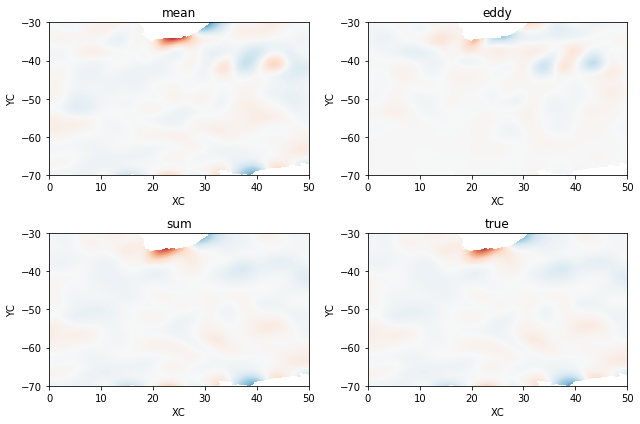

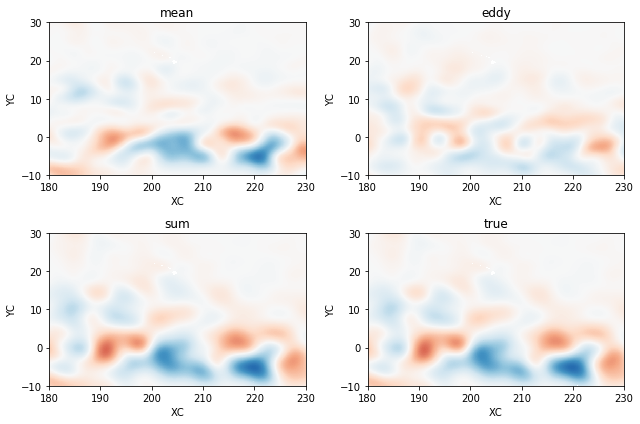

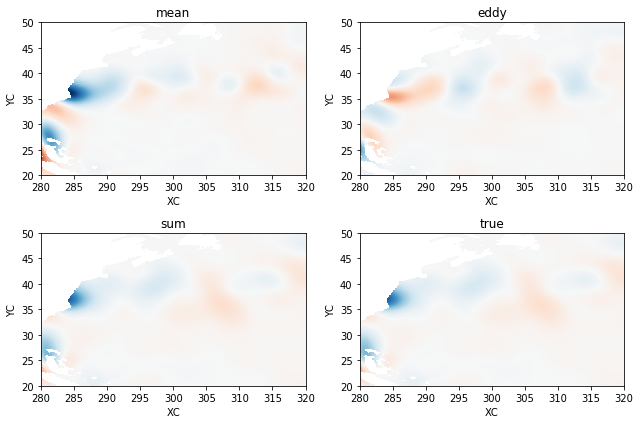

In [238]:
vmax = 5e-8
n = 5
div_uq_first = div_uq[n].load()
div_ubarqbar_first = div_ubarqbar[n].load()
div_upqp_first = div_upqp[n].load() 
for region_name, region in regions.items():
    fig, axes = plt.subplots(ncols=2, nrows=2)
    div_ubarqbar_first.sel(**region).plot(ax=axes[0,0], vmax=vmax, add_colorbar=False)
    div_upqp_first.sel(**region).plot(ax=axes[0,1], vmax=vmax, add_colorbar=False)
    (div_ubarqbar_first + div_upqp_first).sel(**region).plot(ax=axes[1,0], vmax=vmax, add_colorbar=False)
    div_uq_first.sel(**region).plot(ax=axes[1,1], vmax=vmax, add_colorbar=False)
    axes[0,0].set_title('mean')
    axes[0,1].set_title('eddy')  
    axes[1,0].set_title('sum')  
    axes[1,1].set_title('true')      
    fig.tight_layout()
    

In [239]:
# production term
dqbardx = grid.diff(qbar_smooth, 'X') / dsp.dxC * dsp.hFacW
dqbardy = grid.diff(qbar_smooth, 'Y') / dsp.dyC * dsp.hFacS
upqp_dqbardx = upqp * dqbardx
vpqp_dqbardy = vpqp * dqbardy
# cell centered
upqp_gradqbar = grid.interp(upqp_dqbardx, 'X') +  grid.interp(vpqp_dqbardy, 'Y')
upqp_gradqbar

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...

In [175]:
# anomaly gridents
dqpdx2 = spatial_smoother(dsp.DXSqTr01 - dqbardx**2)
dqpdy2 = spatial_smoother(dsp.DYSqTr01 - dqbardy**2)


qp2_dissipation = kappa * (grid.interp(dqpdx2, 'X') +
                           grid.interp(dqpdy2, 'Y'))
qp2_dissipation

<xarray.DataArray (time: 221, YC: 1600, XC: 3600)>
dask.array<shape=(221, 1600, 3600), dtype=float32, chunksize=(1, 1600, 3600)>
Coordinates:
  * time     (time) int64 2592000 5184000 7776000 10368000 12960000 15552000 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...

Text(0.5,1,'dissipation')

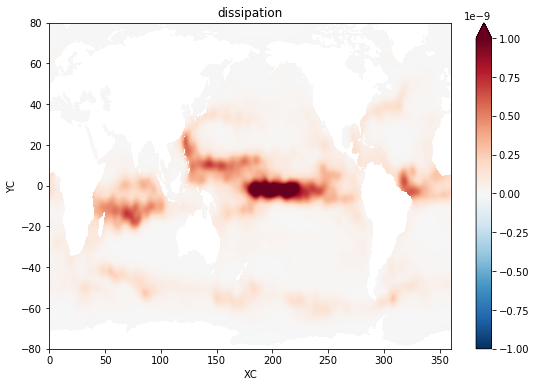

In [244]:
qp2_dissipation[3:6].mean(dim='time').plot(vmax=1e-9)
plt.title('dissipation')

Text(0.5,1,'production')

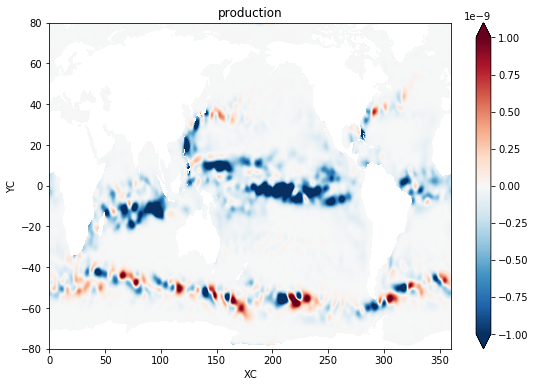

In [242]:
upqp_gradqbar[3:6].mean(dim='time').plot(vmax=1e-9)
plt.title('production')

Text(0.5,1,'residual (3 month average, 20-point std dev)')

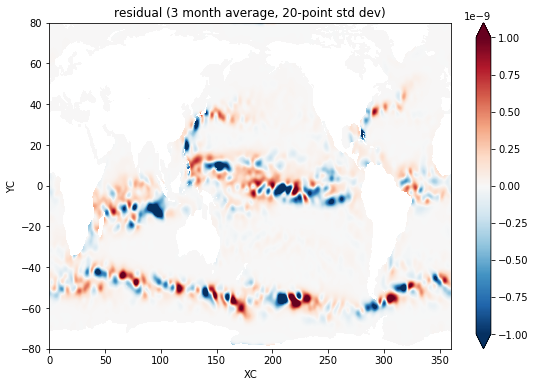

In [245]:
resid = qp2_dissipation + upqp_gradqbar
resid[3:6].mean(dim='time').plot(vmax=1e-9)
plt.title('residual (3 month average, 20-point std dev)')

In [251]:
frac = (abs(resid[3:6].mean(dim='time')) / qp2_dissipation[3:6].mean(dim='time')).load()

Text(0.5,1,'Fraction of Residual to Dissipation')

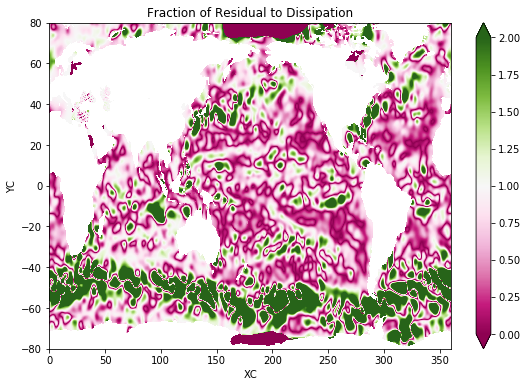

In [258]:
frac.plot(vmax=2, vmin=0, cmap='PiYG')
plt.title('Fraction of Residual to Dissipation')

Text(0.5,1,'Fraction of Residual to Dissipation')

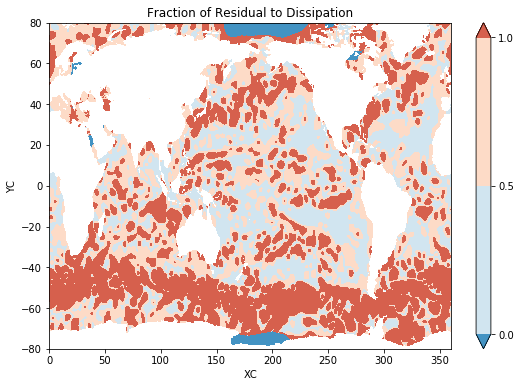

In [262]:
frac.plot.contourf(levels=[0,0.5,1])
plt.title('Fraction of Residual to Dissipation')

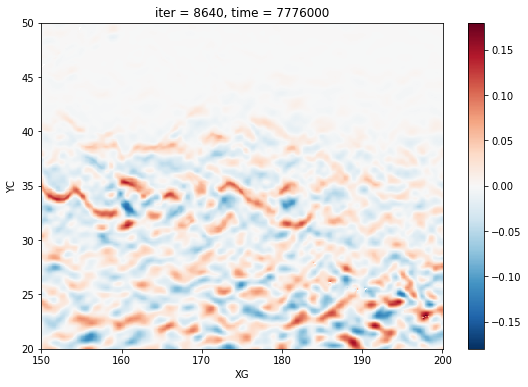

In [214]:
upqp[2].sel(XG=slice(150,200), YC=slice(20,50)).plot()

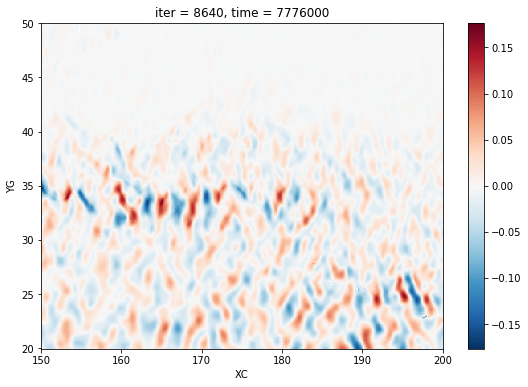

In [213]:
vpqp[2].sel(XC=slice(150,200), YG=slice(20,50)).plot()

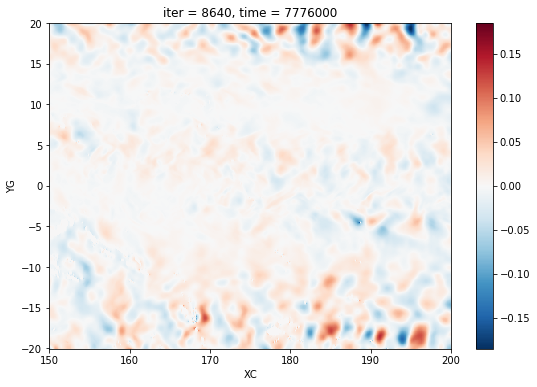

In [196]:
vq_gad[2].sel(XC=slice(150,200), YG=slice(-20, 20)).plot()

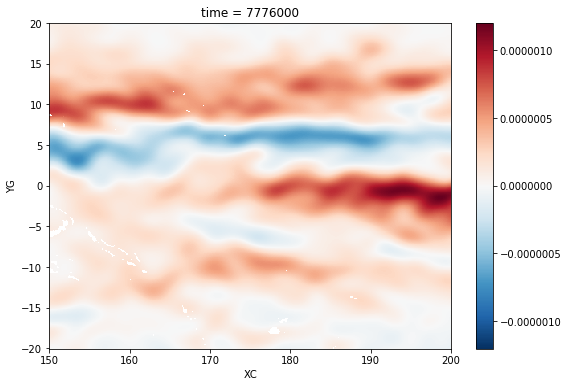

In [203]:
dqbardy[2].sel(XC=slice(150,200), YG=slice(-20,20)).plot()

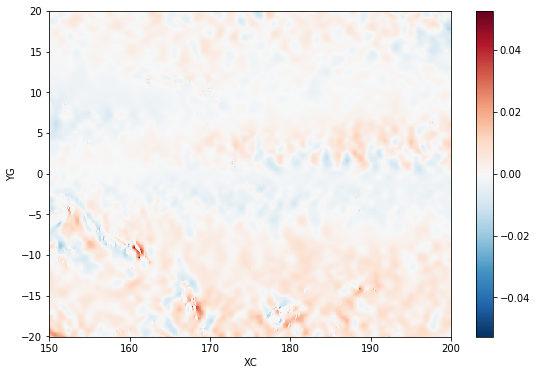

In [197]:
vq_gad.mean(dim='time').sel(XC=slice(150,200), YG=slice(-20, 20)).plot()

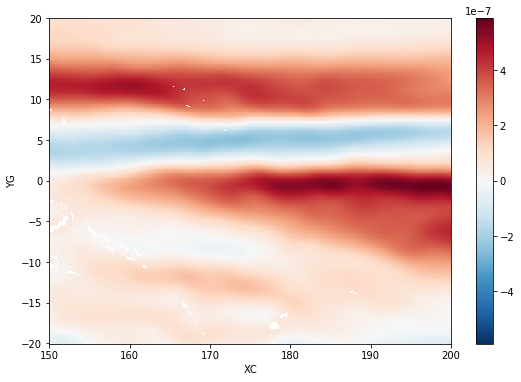

In [202]:
dqbardy.mean(dim='time').sel(XC=slice(150,200), YG=slice(-20,20)).plot()

## Old stuff below

In [53]:
def mean(d):
    return d.where(reset_mask).mean(dim='time').load()

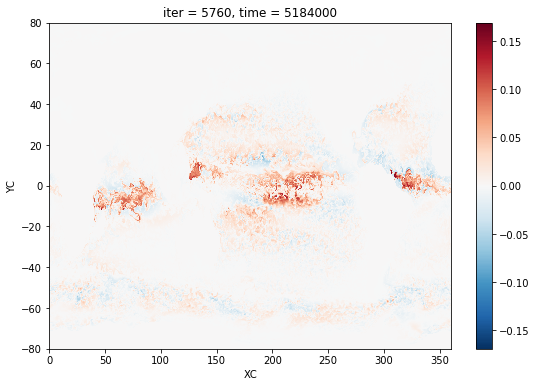

In [114]:
qp2_snap = (ds_snap.TRACSQ01 - ds_mean.TRAC01**2)
qp2_snap[2].plot()

In [113]:
dqp2dt = (ds_snap.TRACSQ01 - ds_mean.TRAC01**2).diff(dim='time') / delta_t

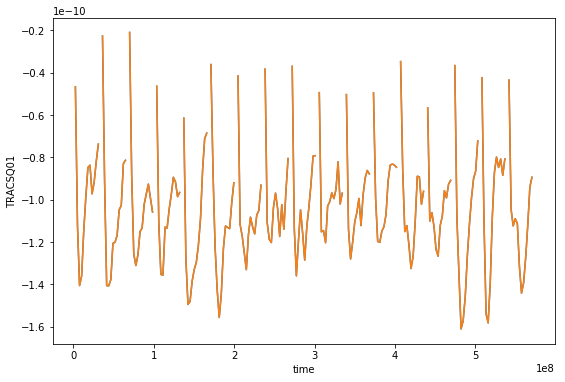

In [112]:
(dqp2dt).mean(dim=['XC', 'YC']).where(reset_mask).plot()
(dq2dt).mean(dim=['XC', 'YC']).where(reset_mask).plot()

In [56]:
ds_mean = mean(dsp)
ds_mean

<xarray.Dataset>
Dimensions:   (XC: 3600, XG: 3600, YC: 1600, YG: 1600, Z: 1, Zl: 1, Zp1: 2, Zu: 1)
Coordinates:
  * XC        (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
  * YC        (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XG        (XG) >f4 -2.77556e-17 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0 ...
  * YG        (YG) >f4 -80.0 -79.9 -79.8 -79.7 -79.6 -79.5 -79.4 -79.3 -79.2 ...
  * Z         (Z) float32 -50.0
  * Zp1       (Zp1) float32 0.0 -100.0
  * Zu        (Zu) float32 -100.0
  * Zl        (Zl) float32 0.0
    rA        (YC, XC) float32 2.15699e+07 2.15699e+07 2.15699e+07 ...
    dxG       (YG, XC) float32 1930.58 1930.58 1930.58 1930.58 1930.58 ...
    dyG       (YC, XG) float32 11117.7 11117.7 11117.7 11117.7 11117.7 ...
    Depth     (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    rAz       (YG, XG) float32 2.14637e+07 2.14637e+07 2.14637e+07 ...
    dxC       (YC, XG) float32 1940.13 1940.13 1940.13 1940.13 194

In [61]:
# use gad fluxes for higher accuracy
uq_gad = dsp.ADVxTr01 / (drF * dsp.dyG)
vq_gad = dsp.ADVyTr01 / (drF * dsp.dxG)
ubarqbar = ds_mean.UVEL * grid.interp(ds_mean.TRAC01, 'X')
vbarqbar = ds_mean.VVEL * grid.interp(ds_mean.TRAC01, 'Y')
upqp = mean(uq_gad - ubarqbar)
vpqp = mean(vq_gad - vbarqbar)

In [62]:
# compare divergence of mean and eddy fluxes
# we don't need the whole budget because we basically already did it in part one...
# this is just a decomposition of the advective fluxes
div_ubarqbar = (  grid.diff(ubarqbar * dsp.dyG, 'X')
                + grid.diff(vbarqbar * dsp.dxG, 'Y')) / dsp.rA
div_ubarqbar.load()

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [ -6.115655e-10,  -1.413602e-09,  -1.877337e-09, ...,  -1.449411e-09,
         -1.185607e-09,  -9.147270e-10],
       [ -3.040245e-09,  -3.623030e-09,  -3.704911e-09, ...,  -3.992902e-09,
         -3.197175e-09,  -3.756534e-09],
       [ -5.578885e-09,  -6.094554e-09,  -6.474903e-09, ...,  -5.259782e-09,
         -4.745328e-09,  -5.155962e-09]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) float32 2.15699e+07 2.15699e+07 

In [63]:
div_upqp = (  grid.diff(upqp * dsp.dyG, 'X')
            + grid.diff(vpqp * dsp.dxG, 'Y')) / dsp.rA
div_upqp.load()

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [  6.781077e-10,   7.473042e-10,   1.025368e-09, ...,   5.891376e-10,
          5.971288e-10,   6.432902e-10],
       [  1.473159e-09,   1.529711e-09,   1.703142e-09, ...,   1.226140e-09,
          1.239718e-09,   1.376432e-09],
       [  2.143622e-09,   2.361955e-09,   2.801816e-09, ...,   1.505440e-09,
          1.644266e-09,   1.903922e-09]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) float32 2.15699e+07 2.15699e+07 

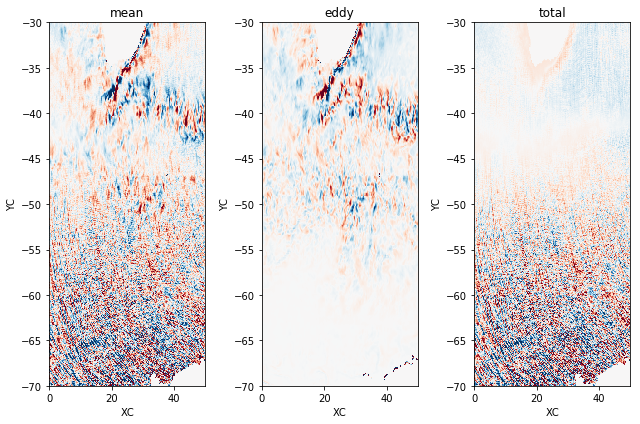

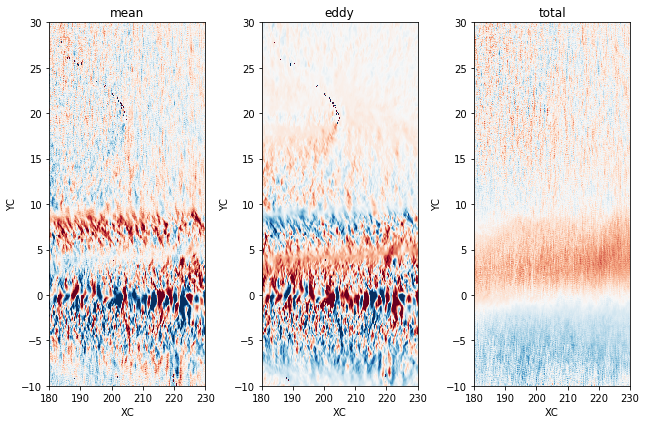

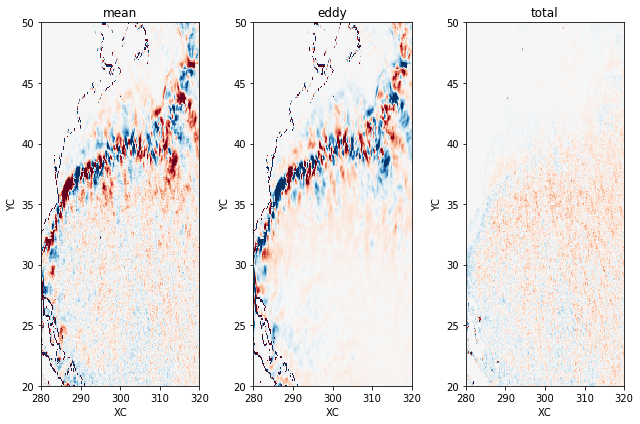

In [67]:
vmax = 2e-8
for region_name, region in regions.items():
    fig, axes = plt.subplots(ncols=3)
    div_ubarqbar.sel(**region).plot(ax=axes[0], vmax=vmax, add_colorbar=False)
    div_upqp.sel(**region).plot(ax=axes[1], vmax=vmax, add_colorbar=False)
    (div_ubarqbar + div_upqp).sel(**region).plot(ax=axes[2], vmax=vmax, add_colorbar=False)
    axes[0].set_title('mean')
    axes[1].set_title('eddy')  
    axes[2].set_title('total')      
    fig.tight_layout()
    

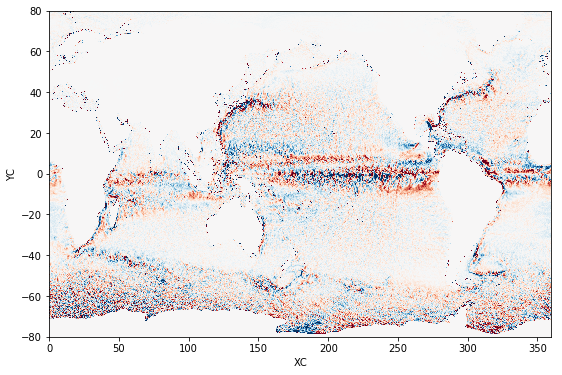

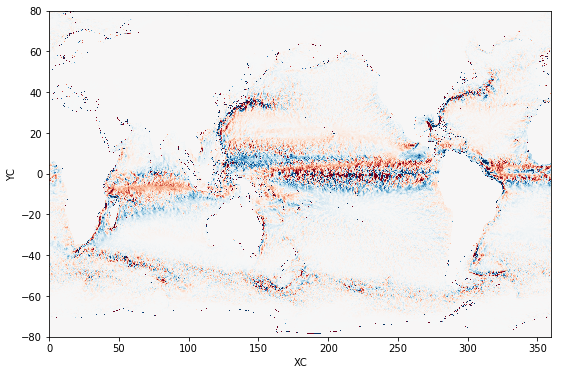

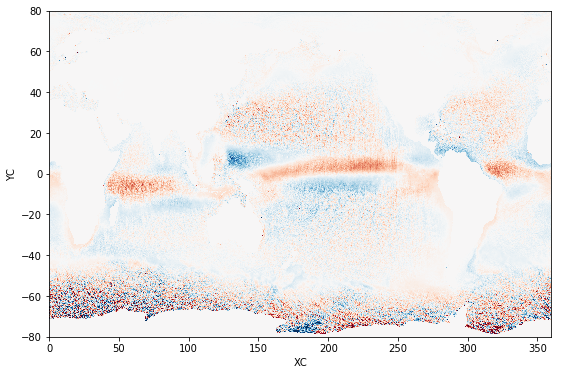

In [68]:
plt.figure()
div_ubarqbar.plot(vmax=vmax, add_colorbar=False)
plt.figure()
div_upqp.plot(vmax=vmax, add_colorbar=False)
plt.figure()
(div_ubarqbar + div_upqp).plot(vmax=vmax, add_colorbar=False)

How to recover the tracer variance advection term:

$$ \overline{u} \ \overline{{q'}^2} + \overline{u'{q'}^2} = \overline{uq^2} - \overline{u} \ \overline{q}^2 - \overline{u'q'} \ \overline{q}  $$

In [135]:
uqp2 = (ds_mean.UTrSq01
        - ds_mean.UVEL * grid.interp(ds_mean.TRAC01**2, 'X')
        - upqp * grid.interp(ds_mean.TRAC01, 'X')) * dsp.hFacW
vqp2 = (ds_mean.VTrSq01
        - ds_mean.VVEL * grid.interp(ds_mean.TRAC01**2, 'Y')
        - vpqp * grid.interp(ds_mean.TRAC01, 'Y')) * dsp.hFacS
div_uqp2 = (  grid.diff(uqp2 * dsp.dyG, 'X')
            + grid.diff(vqp2 * dsp.dxG, 'Y')) / dsp.rA
div_uqp2.load()

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [  2.272153e-11,   2.576454e-11,   3.075844e-11, ...,   2.096790e-11,
          2.116379e-11,   2.214384e-11],
       [  4.907741e-11,   5.363729e-11,   6.393706e-11, ...,   3.632926e-11,
          4.017652e-11,   4.538442e-11],
       [  5.470967e-11,   6.126211e-11,   6.009639e-11, ...,   3.611745e-11,
          4.101555e-11,   4.819945e-11]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
    rA       (YC, XC) float32 2.15699e+07 2.15699e+07 

In [92]:
qp2 = ds_mean.TRACSQ01 - ds_mean.TRAC01**2
qp2_div_vel = mean(qp2 * div_vel_flux)
qp2_div_vel

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [ -1.364947e-13,  -7.390061e-13,  -4.569558e-13, ...,  -4.461713e-13,
         -4.660693e-13,  -3.185405e-13],
       [ -6.722046e-13,  -1.140445e-12,  -9.308740e-13, ...,  -7.356089e-13,
         -5.762738e-13,  -8.548504e-13],
       [ -9.785929e-13,  -1.229316e-12,  -1.309090e-12, ...,  -6.288085e-13,
         -6.100670e-13,  -7.750180e-13]], dtype=float32)
Coordinates:
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
    rA       (YC, XC) float32 2.15699e+07 2.15699e+07 

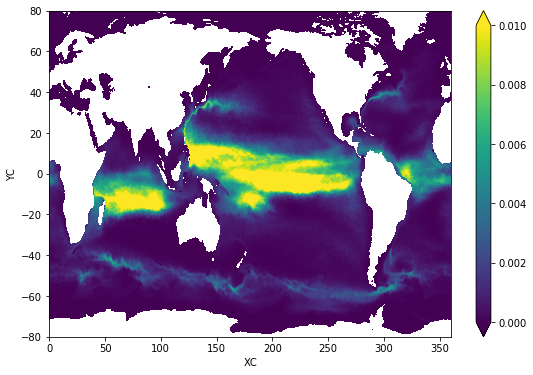

In [78]:
(qp2.where(dsp.hFacC)).plot(vmax=1e-2, vmin=0)

In [125]:
# production term
dqbardx = grid.diff(ds_mean.TRAC01, 'X') / dsp.dxC * dsp.hFacW
dqbardy = grid.diff(ds_mean.TRAC01, 'Y') / dsp.dyC * dsp.hFacS
upqp_dqbardx = (upqp * dqbardx)
vpqp_dqbardy = (vpqp * dqbardy)
# cell centered
upqp_gradqbar = grid.interp(upqp_dqbardx, 'X') +  grid.interp(vpqp_dqbardy, 'Y')
upqp_gradqbar.load()

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [  2.335846e-13,  -6.073267e-15,  -1.725143e-12, ...,  -1.354543e-12,
         -1.834116e-13,   1.439456e-13],
       [ -1.038941e-12,  -1.684136e-12,  -3.779260e-12, ...,  -8.298369e-13,
         -4.031439e-13,  -6.100784e-13],
       [ -2.887040e-12,  -4.764973e-12,  -8.072854e-12, ...,  -6.706633e-13,
         -9.656771e-13,  -1.708604e-12]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...

In [84]:
qp2_dissipation = kappa * (grid.interp((ds_mean.DXSqTr01 - dqbardx**2) * dsp.hFacW, 'X') +
                           grid.interp((ds_mean.DYSqTr01 - dqbardy**2) * dsp.hFacS, 'Y'))
qp2_dissipation.load()

<xarray.DataArray (YC: 1600, XC: 3600)>
array([[  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       [  0.000000e+00,   0.000000e+00,   0.000000e+00, ...,   0.000000e+00,
          0.000000e+00,   0.000000e+00],
       ..., 
       [  6.647937e-12,   7.424713e-12,   7.702229e-12, ...,   6.025549e-12,
          5.831237e-12,   5.900523e-12],
       [  6.480138e-12,   7.413677e-12,   8.597871e-12, ...,   4.763523e-12,
          5.433880e-12,   5.858148e-12],
       [  5.615096e-12,   7.172736e-12,   9.441270e-12, ...,   3.511910e-12,
          4.136489e-12,   4.785668e-12]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC       (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 1.05 ...

In [136]:
qp2_budget = xr.Dataset({#'tendency': mean(dqp2dt)/2,
                        'advection': div_uqp2/2, 
                        #'diffusion': skip for now
                        'production': upqp_gradqbar,
                        'dissipation': qp2_dissipation,
                        'divergence': -qp2_div_vel/2})

In [142]:
qp2_budget['residual'] = (#qp2_budget.tendency +
                          #qp2_budget.advection +
                          qp2_budget.dissipation + qp2_budget.production +
                          qp2_budget.divergence)
qp2_budget

<xarray.Dataset>
Dimensions:      (XC: 3600, YC: 1600)
Coordinates:
  * YC           (YC) >f4 -79.95 -79.85 -79.75 -79.65 -79.55 -79.45 -79.35 ...
  * XC           (XC) >f4 0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95 ...
    rA           (YC, XC) float32 2.15699e+07 2.15699e+07 2.15699e+07 ...
    Depth        (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    hFacC        (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
Data variables:
    advection    (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    production   (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    dissipation  (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    divergence   (YC, XC) float32 -0.0 -0.0 -0.0 -0.0 -0.0 -0.0 -0.0 -0.0 ...
    residual     (YC, XC) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...

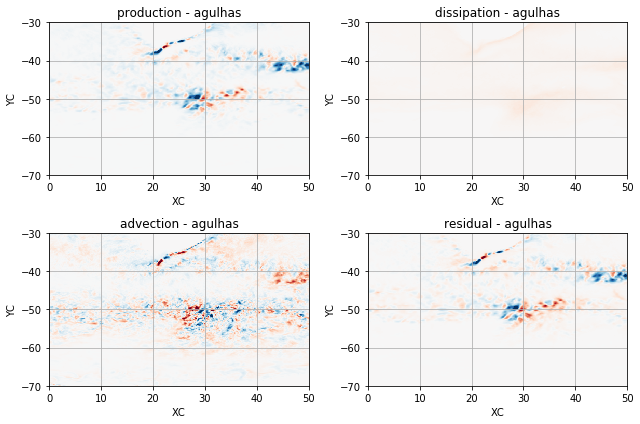

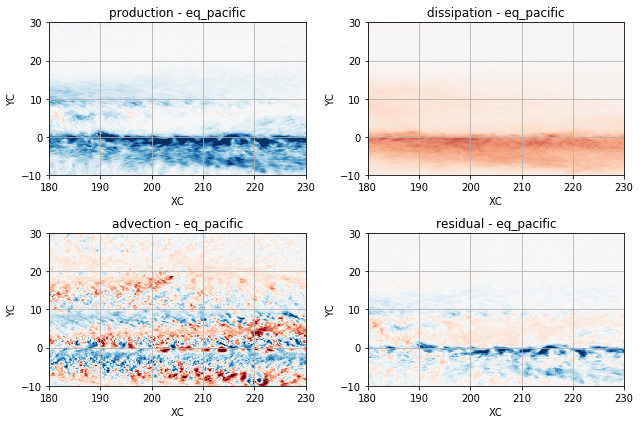

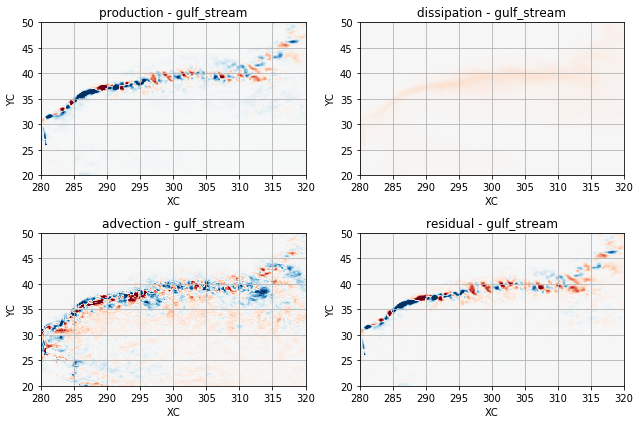

In [147]:
terms = ['production', 'dissipation', 'advection', 'residual']
vmax = 2e-9
plot_kwargs = dict(vmax=vmax, vmin=-vmax, cmap='RdBu_r', add_colorbar=False)
for region_name, region in regions.items():
    fig, (row1, row2) = plt.subplots(ncols=2, nrows=2)
    axes = tuple(row1) + tuple(row2)
    for term, ax in zip (terms, axes):
        qp2_budget[term].sel(**region).plot(ax=ax, **plot_kwargs)
        ax.set_title(term + ' - ' + region_name)
        ax.grid()
    fig.tight_layout()

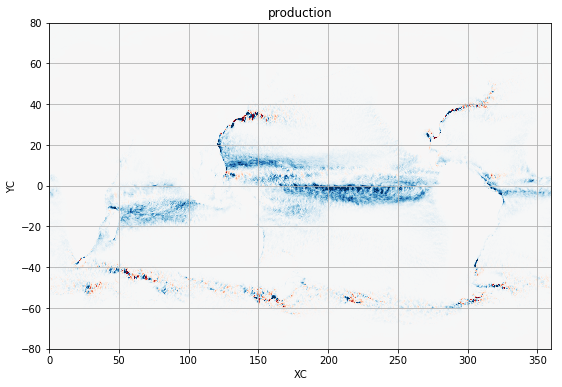

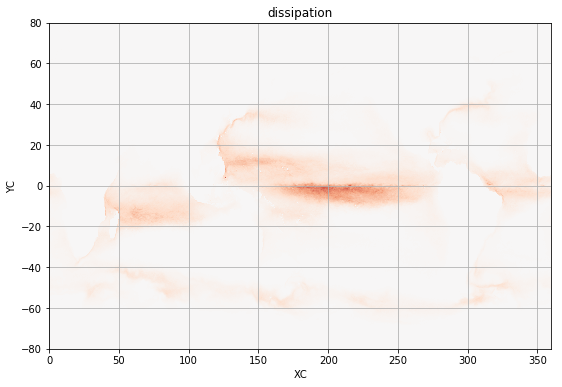

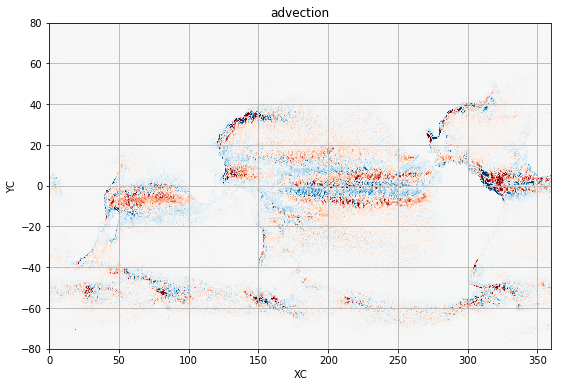

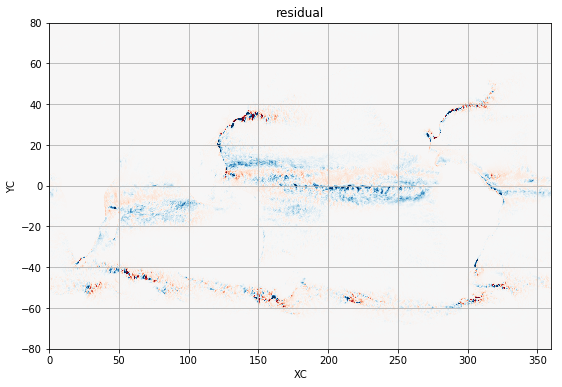

In [145]:
terms = ['production', 'dissipation', 'advection', 'residual']
vmax = 2e-9
plot_kwargs = dict(vmax=vmax, vmin=-vmax, cmap='RdBu_r', add_colorbar=False)
for term in terms:
    plt.figure()
    qp2_budget[term].plot(**plot_kwargs)
    plt.title(term)
    plt.grid()


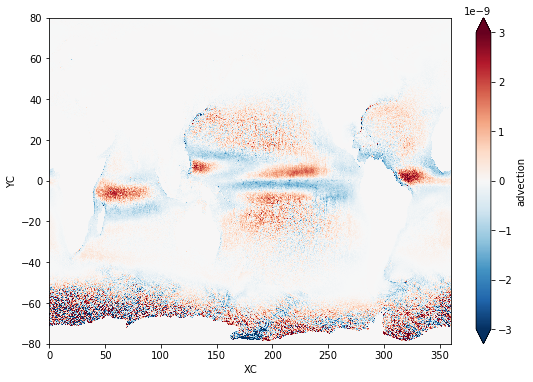

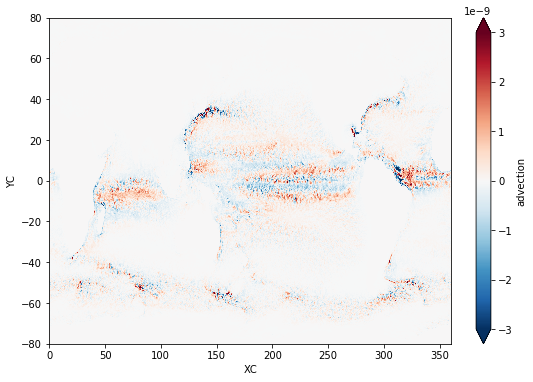

In [148]:
q2_budget_mean.advection.plot(vmax=3e-9)
plt.figure()
qp2_budget.advection.plot(vmax=3e-9)

In [44]:
div_vel_flux_mean = div_vel_flux.mean(dim='time').load()
div_vel_flux_std = div_vel_flux.std(dim='time').load()

In [51]:
div_vel_flux_rms = (div_vel_flux**2).mean(dim='time').load()**0.5

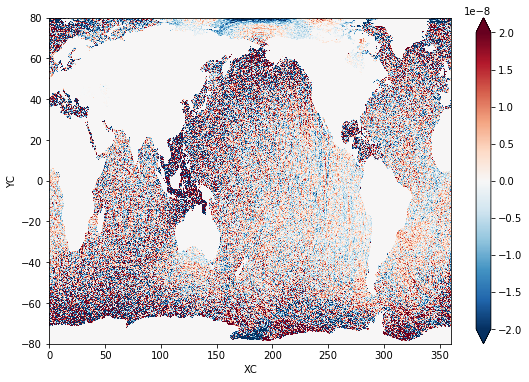

In [48]:
div_vel_flux_mean.plot(vmax=2e-8)

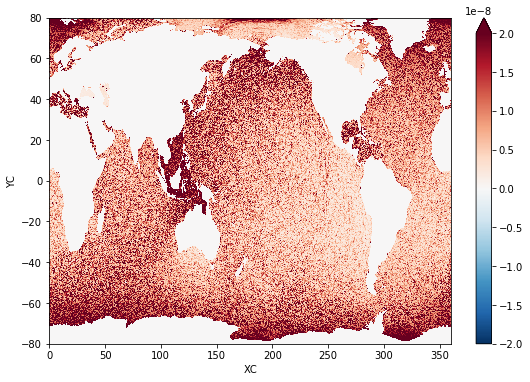

In [53]:
div_vel_flux_rms.plot(vmax=2e-8, vmin=-2e-8, cmap='RdBu_r')

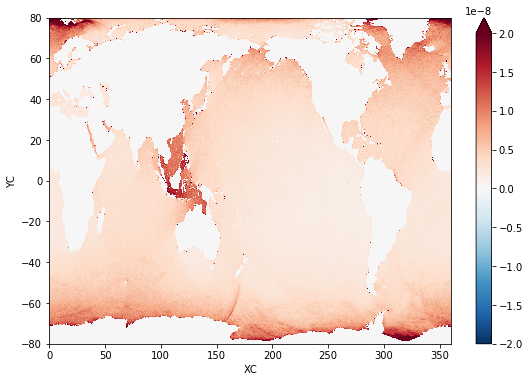

In [54]:
div_vel_flux_std.plot(vmax=2e-8, vmin=-2e-8, cmap='RdBu_r')